Import de les llibreries necessàries

In [1]:
from sklearn.datasets import make_regression
import numpy as np
import pandas as pd
%matplotlib notebook
from matplotlib import pyplot as plt
import scipy.stats
import category_encoders as ce
import seaborn as sns
from sklearn.preprocessing import StandardScaler

Carreguem el dataset

In [2]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
def load_dataset(path):
    dataset = pd.read_csv(path, header=0, delimiter=',')
    return dataset

#### DESCRIPCIÓ DEL DATASET ####
El dataset consisteix en 20.000 jocs d'escacs de la web Lichess.org

Analitzem el dataset

In [3]:
dataset = load_dataset('games.csv')
data = dataset.values
print("Dimensionalitat de la BBDD:", dataset.shape)

Dimensionalitat de la BBDD: (20058, 16)


In [4]:
dataset.head()

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
0,TZJHLljE,False,1504210000000.000,1504210000000.000,13,outoftime,white,15+2,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5
1,l1NXvwaE,True,1504130000000.000,1504130000000.000,16,resign,black,5+10,a-00,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4
2,mIICvQHh,True,1504130000000.000,1504130000000.000,61,mate,white,5+10,ischia,1496,a-00,1500,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3
3,kWKvrqYL,True,1504110000000.000,1504110000000.000,61,mate,white,20+0,daniamurashov,1439,adivanov2009,1454,d4 d5 Nf3 Bf5 Nc3 Nf6 Bf4 Ng4 e3 Nc6 Be2 Qd7 O...,D02,Queen's Pawn Game: Zukertort Variation,3
4,9tXo1AUZ,True,1504030000000.000,1504030000000.000,95,mate,white,30+3,nik221107,1523,adivanov2009,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5


In [5]:
dataset['winner'].value_counts()

white    10001
black     9107
draw       950
Name: winner, dtype: int64

In [6]:
len(dataset)

20058

In [7]:
len(dataset[dataset['winner'] == 'draw'])

950

In [8]:
dataset

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
0,TZJHLljE,False,1504210000000.000,1504210000000.000,13,outoftime,white,15+2,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5
1,l1NXvwaE,True,1504130000000.000,1504130000000.000,16,resign,black,5+10,a-00,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4
2,mIICvQHh,True,1504130000000.000,1504130000000.000,61,mate,white,5+10,ischia,1496,a-00,1500,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3
3,kWKvrqYL,True,1504110000000.000,1504110000000.000,61,mate,white,20+0,daniamurashov,1439,adivanov2009,1454,d4 d5 Nf3 Bf5 Nc3 Nf6 Bf4 Ng4 e3 Nc6 Be2 Qd7 O...,D02,Queen's Pawn Game: Zukertort Variation,3
4,9tXo1AUZ,True,1504030000000.000,1504030000000.000,95,mate,white,30+3,nik221107,1523,adivanov2009,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20053,EfqH7VVH,True,1499790914342.000,1499791236076.000,24,resign,white,10+10,belcolt,1691,jamboger,1220,d4 f5 e3 e6 Nf3 Nf6 Nc3 b6 Be2 Bb7 O-O Be7 Ne5...,A80,Dutch Defense,2
20054,WSJDhbPl,True,1499698089760.000,1499698833979.000,82,mate,black,10+0,jamboger,1233,farrukhasomiddinov,1196,d4 d6 Bf4 e5 Bg3 Nf6 e3 exd4 exd4 d5 c3 Bd6 Bd...,A41,Queen's Pawn,2
20055,yrAas0Kj,True,1499697877493.000,1499698050327.000,35,mate,white,10+0,jamboger,1219,schaaksmurf3,1286,d4 d5 Bf4 Nc6 e3 Nf6 c3 e6 Nf3 Be7 Bd3 O-O Nbd...,D00,Queen's Pawn Game: Mason Attack,3
20056,b0v4tRyF,True,1499696127019.000,1499697073718.000,109,resign,white,10+0,marcodisogno,1360,jamboger,1227,e4 d6 d4 Nf6 e5 dxe5 dxe5 Qxd1+ Kxd1 Nd5 c4 Nb...,B07,Pirc Defense,4


In [9]:
dataset.nunique() < 5

id                False
rated              True
created_at        False
last_move_at      False
turns             False
victory_status     True
winner             True
increment_code    False
white_id          False
white_rating      False
black_id          False
black_rating      False
moves             False
opening_eco       False
opening_name      False
opening_ply       False
dtype: bool

Hi ha molts atributs que s'han de transformar a numèrics. Anarf a practica 2 i mirar com fer-ho

In [10]:
dataset.nunique()

id                19113
rated                 2
created_at        13151
last_move_at      13186
turns               211
victory_status        4
winner                3
increment_code      400
white_id           9438
white_rating       1516
black_id           9331
black_rating       1521
moves             18920
opening_eco         365
opening_name       1477
opening_ply          23
dtype: int64

Anem a netejar les dades

Mirem el nombre de valors desconeguts que té cada atribut

In [11]:
llargada= len(dataset)

print("id:", (int(len(dataset[dataset["id"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["id"]=="?"])))/llargada)*100, 1),"%")

print("rated:", (int(len(dataset[dataset["rated"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["rated"]=="?"])))/llargada)*100, 1),"%")

print("created at:", (int(len(dataset[dataset["created_at"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["created_at"]=="?"])))/llargada)*100, 1),"%")

print("last move at:", (int(len(dataset[dataset["last_move_at"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["last_move_at"]=="?"])))/llargada)*100, 1),"%")

print("turns:", (int(len(dataset[dataset["turns"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["turns"]=="?"])))/llargada)*100, 1),"%")

print("victory status:", (int(len(dataset[dataset["victory_status"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["victory_status"]=="?"])))/llargada)*100, 1),"%")

print("winner:", (int(len(dataset[dataset["winner"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["winner"]=="?"])))/llargada)*100, 1),"%")

print("increment code:", (int(len(dataset[dataset["increment_code"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["increment_code"]=="?"])))/llargada)*100, 1),"%")

print("white rating:", (int(len(dataset[dataset["white_rating"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["white_rating"]=="?"])))/llargada)*100, 1),"%")

print("white id:", (int(len(dataset[dataset["white_id"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["white_id"]=="?"])))/llargada)*100, 1),"%")

print("black rating:", (int(len(dataset[dataset["black_rating"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["black_rating"]=="?"])))/llargada)*100, 1),"%")

print("black id:", (int(len(dataset[dataset["black_id"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["black_id"]=="?"])))/llargada)*100, 1),"%")

print("moves:", (int(len(dataset[dataset["moves"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["moves"]=="?"])))/llargada)*100, 1),"%")

print("opening eco:", (int(len(dataset[dataset["opening_eco"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["opening_eco"]=="?"])))/llargada)*100, 1),"%")

print("opening name:", (int(len(dataset[dataset["opening_name"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["opening_name"]=="?"])))/llargada)*100, 1),"%")

print("opening ply:", (int(len(dataset[dataset["opening_ply"]=="?"]))), "valors desconeguts, ",
      round(((int(len(dataset[dataset["opening_ply"]=="?"])))/llargada)*100, 1),"%")


id: 0 valors desconeguts,  0.0 %
rated: 0 valors desconeguts,  0.0 %
created at: 0 valors desconeguts,  0.0 %
last move at: 0 valors desconeguts,  0.0 %
turns: 0 valors desconeguts,  0.0 %
victory status: 0 valors desconeguts,  0.0 %
winner: 0 valors desconeguts,  0.0 %
increment code: 0 valors desconeguts,  0.0 %
white rating: 0 valors desconeguts,  0.0 %
white id: 0 valors desconeguts,  0.0 %
black rating: 0 valors desconeguts,  0.0 %
black id: 0 valors desconeguts,  0.0 %
moves: 0 valors desconeguts,  0.0 %
opening eco: 0 valors desconeguts,  0.0 %
opening name: 0 valors desconeguts,  0.0 %
opening ply: 0 valors desconeguts,  0.0 %


Convwerteixo els aatributs de text en numèrics (preprocessing)

In [12]:
# Transformar l'atribut rated a binari (True = 1, False = 0)
dataset["rated_bi"] = np.where(dataset["rated"] == True , 1, 0)

In [13]:
# Transformació dels atributs 'created_at' i 'last_move_at' en un de únic anomenat game_lenght

# Aquests dos atruibuts estan representats com a unix time, així que s'ha de convertir el resultat de la resta 
#per tenir-ho en minuts

dataset["game_length"] = (dataset["last_move_at"] - dataset["created_at"]).apply(lambda x : round(x / 1000 / 60, 2))

In [14]:
d1 = dataset["victory_status"].unique()

In [15]:
d2 = np.array(dataset["victory_status"])

In [16]:
d1[0] == d2[0]

True

In [17]:
# En el cas de l'atribut 'victory_status', com que conté dades nominals el camí a seguir per transformar a dades nominals
# és mitjançant 'one-hot encoding'.

encoder = ce.OneHotEncoder(cols="victory_status",handle_unknown='return_nan',return_df=True,use_cat_names=True)

dataset = encoder.fit_transform(dataset)
dataset

,id,rated,created_at,last_move_at,turns,victory_status_outoftime,victory_status_resign,victory_status_mate,victory_status_draw,winner,...,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply,rated_bi,game_length
0,TZJHLljE,False,1504210000000.000,1504210000000.000,13,1.000,0.000,0.000,0.000,white,...,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5,0,0.000
1,l1NXvwaE,True,1504130000000.000,1504130000000.000,16,0.000,1.000,0.000,0.000,black,...,a-00,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4,1,0.000
2,mIICvQHh,True,1504130000000.000,1504130000000.000,61,0.000,0.000,1.000,0.000,white,...,ischia,1496,a-00,1500,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3,1,0.000
3,kWKvrqYL,True,1504110000000.000,1504110000000.000,61,0.000,0.000,1.000,0.000,white,...,daniamurashov,1439,adivanov2009,1454,d4 d5 Nf3 Bf5 Nc3 Nf6 Bf4 Ng4 e3 Nc6 Be2 Qd7 O...,D02,Queen's Pawn Game: Zukertort Variation,3,1,0.000
4,9tXo1AUZ,True,1504030000000.000,1504030000000.000,95,0.000,0.000,1.000,0.000,white,...,nik221107,1523,adivanov2009,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5,1,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20053,EfqH7VVH,True,1499790914342.000,1499791236076.000,24,0.000,1.000,0.000,0.000,white,...,belcolt,1691,jamboger,1220,d4 f5 e3 e6 Nf3 Nf6 Nc3 b6 Be2 Bb7 O-O Be7 Ne5...,A80,Dutch Defense,2,1,5.360
20054,WSJDhbPl,True,1499698089760.000,1499698833979.000,82,0.000,0.000,1.000,0.000,black,...,jamboger,1233,farrukhasomiddinov,1196,d4 d6 Bf4 e5 Bg3 Nf6 e3 exd4 exd4 d5 c3 Bd6 Bd...,A41,Queen's Pawn,2,1,12.400
20055,yrAas0Kj,True,1499697877493.000,1499698050327.000,35,0.000,0.000,1.000,0.000,white,...,jamboger,1219,schaaksmurf3,1286,d4 d5 Bf4 Nc6 e3 Nf6 c3 e6 Nf3 Be7 Bd3 O-O Nbd...,D00,Queen's Pawn Game: Mason Attack,3,1,2.880
20056,b0v4tRyF,True,1499696127019.000,1499697073718.000,109,0.000,1.000,0.000,0.000,white,...,marcodisogno,1360,jamboger,1227,e4 d6 d4 Nf6 e5 dxe5 dxe5 Qxd1+ Kxd1 Nd5 c4 Nb...,B07,Pirc Defense,4,1,15.780


In [18]:
# Creo un atribut anomenat 'rating_dist' que serà la diferència de 'rating' dels dos jugadors
dataset['rating_dist'] = abs(dataset['white_rating'] - dataset['black_rating'])
dataset.head()

,id,rated,created_at,last_move_at,turns,victory_status_outoftime,victory_status_resign,victory_status_mate,victory_status_draw,winner,...,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply,rated_bi,game_length,rating_dist
0,TZJHLljE,False,1504210000000.000,1504210000000.000,13,1.000,0.000,0.000,0.000,white,...,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5,0,0.000,309
1,l1NXvwaE,True,1504130000000.000,1504130000000.000,16,0.000,1.000,0.000,0.000,black,...,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4,1,0.000,61
2,mIICvQHh,True,1504130000000.000,1504130000000.000,61,0.000,0.000,1.000,0.000,white,...,1496,a-00,1500,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3,1,0.000,4
3,kWKvrqYL,True,1504110000000.000,1504110000000.000,61,0.000,0.000,1.000,0.000,white,...,1439,adivanov2009,1454,d4 d5 Nf3 Bf5 Nc3 Nf6 Bf4 Ng4 e3 Nc6 Be2 Qd7 O...,D02,Queen's Pawn Game: Zukertort Variation,3,1,0.000,15
4,9tXo1AUZ,True,1504030000000.000,1504030000000.000,95,0.000,0.000,1.000,0.000,white,...,1523,adivanov2009,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5,1,0.000,54


Data exploration

In [19]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
created_at,20058.000,1483616852629.092,28501509421.005,1376771633173.000,1477547500000.000,1496010000000.000,1503170000000.000,1504493143790.000
last_move_at,20058.000,1483617722336.144,28501400588.890,1376771863841.000,1477547500000.000,1496010000000.000,1503170000000.000,1504493827262.000
turns,20058.000,60.466,33.571,1.000,37.000,55.000,79.000,349.000
victory_status_outoftime,20058.000,0.084,0.277,0.000,0.000,0.000,0.000,1.000
victory_status_resign,20058.000,0.556,0.497,0.000,0.000,1.000,1.000,1.000
victory_status_mate,20058.000,0.315,0.465,0.000,0.000,0.000,1.000,1.000
victory_status_draw,20058.000,0.045,0.208,0.000,0.000,0.000,0.000,1.000
white_rating,20058.000,1596.632,291.253,784.000,1398.000,1567.000,1793.000,2700.000
black_rating,20058.000,1588.832,291.036,789.000,1391.000,1562.000,1784.000,2723.000
opening_ply,20058.000,4.817,2.797,1.000,3.000,4.000,6.000,28.000


In [20]:
# Anem a visualitzar les dades

In [21]:
# Una cosa que destaca al mirar la descripció del dataset és que la mitjana del primer 25% de l'atribut 'game_length' és 0
# Això no té sentit així que anem a visualitzar l'atribut

<IPython.core.display.Javascript object>


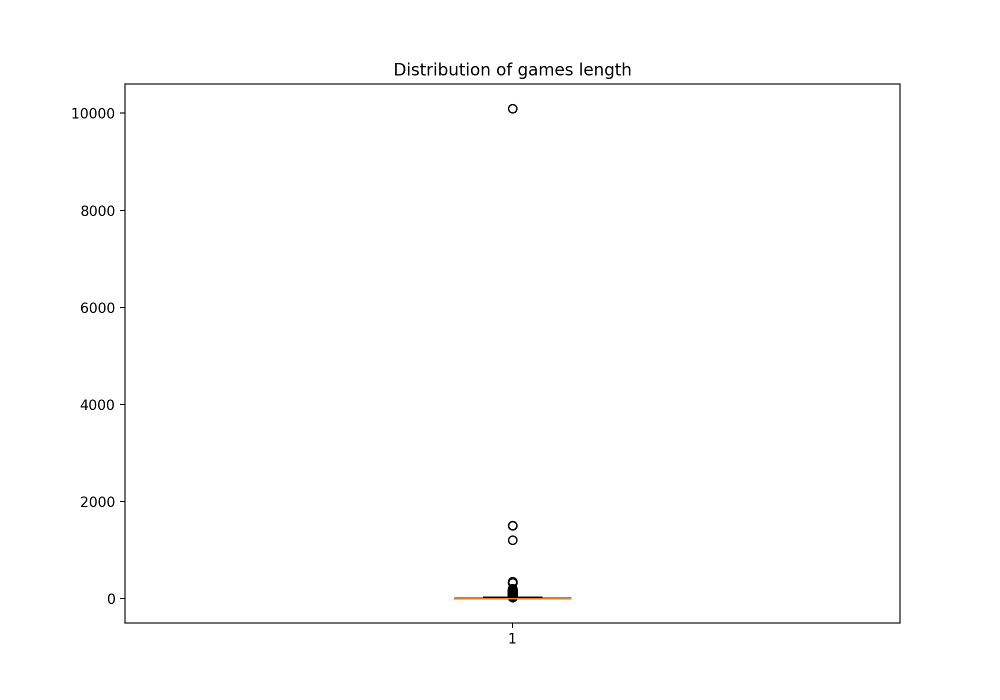

In [22]:
fig = plt.figure(figsize =(10, 7))
plt.boxplot(dataset['game_length'])
plt.title('Distribution of games length')
plt.show()

<IPython.core.display.Javascript object>


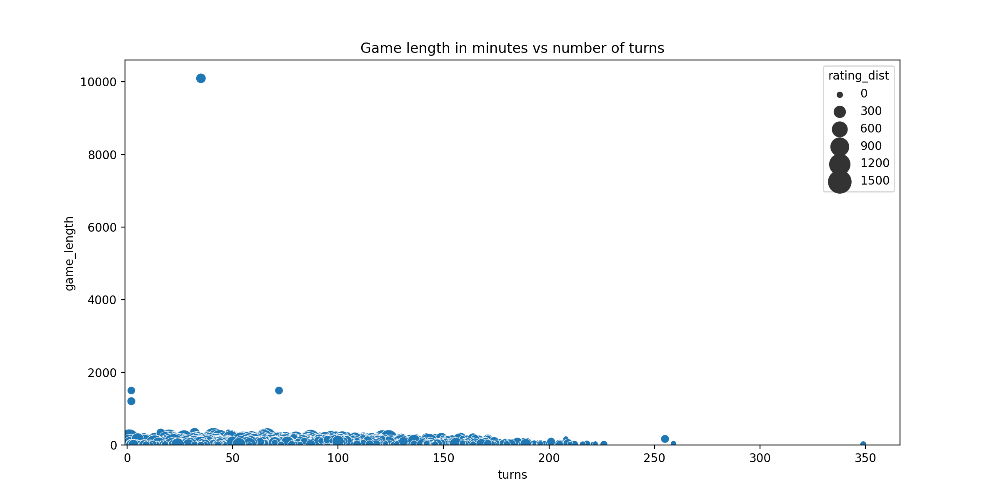

In [23]:
plt.figure(figsize=(12,6))

sns.scatterplot(data=dataset, x='turns', y='game_length', size='rating_dist', sizes=(20, 400))

plt.title('Game length in minutes vs number of turns')
plt.xlim((-1))
plt.ylim((-1))

plt.show()

In [24]:
# Veiem clarament que hi ha un outlier
outlier = dataset[dataset["game_length"] > 10000]
outlier

,id,rated,created_at,last_move_at,turns,victory_status_outoftime,victory_status_resign,victory_status_mate,victory_status_draw,winner,...,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply,rated_bi,game_length,rating_dist
10754,eyhzu8aj,False,1389882733749.000,1390488578450.000,35,0.000,1.000,0.000,0.000,white,...,1245,miladghasemi,1011,d4 f6 Nf3 e5 e3 Nc6 Nc3 d5 Nb5 Qd7 Bd2 a6 Na3 ...,A40,Queen's Pawn,1,0,10097.410,234


<IPython.core.display.Javascript object>


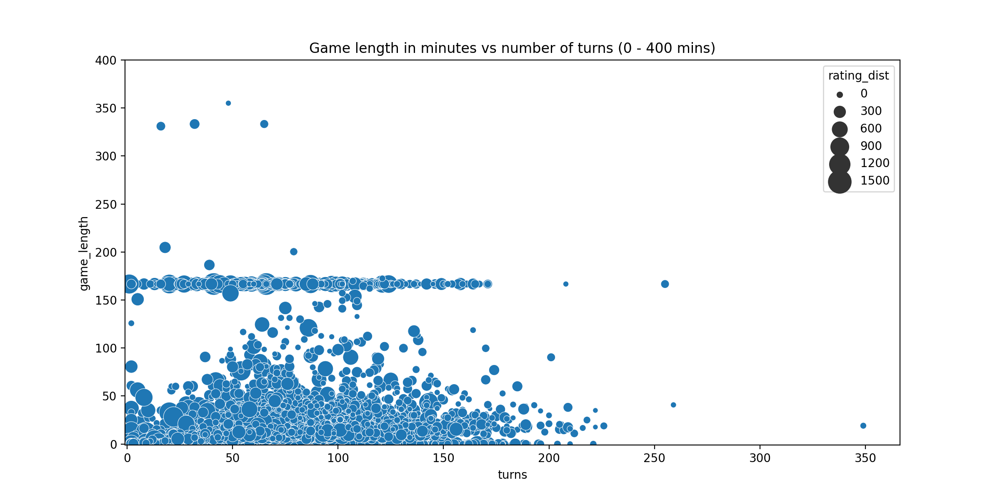

In [25]:
plt.figure(figsize=(12,6))

sns.scatterplot(data=dataset, x='turns', y='game_length', size='rating_dist', sizes=(20, 400))

plt.title('Game length in minutes vs number of turns (0 - 400 mins)')
plt.xlim((-1))
plt.ylim((-1, 400))

plt.show()

<IPython.core.display.Javascript object>


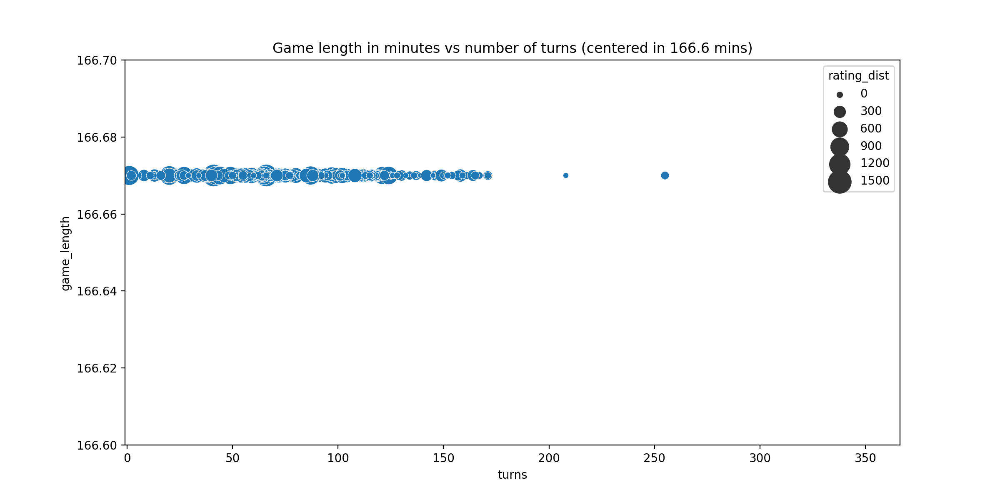

In [26]:
plt.figure(figsize=(12,6))

sns.scatterplot(data=dataset, x='turns', y='game_length', size='rating_dist', sizes=(20, 400))

plt.title('Game length in minutes vs number of turns (centered in 166.6 mins)')
plt.xlim((-1))
plt.ylim((166.6, 166.7))

plt.show()

<IPython.core.display.Javascript object>


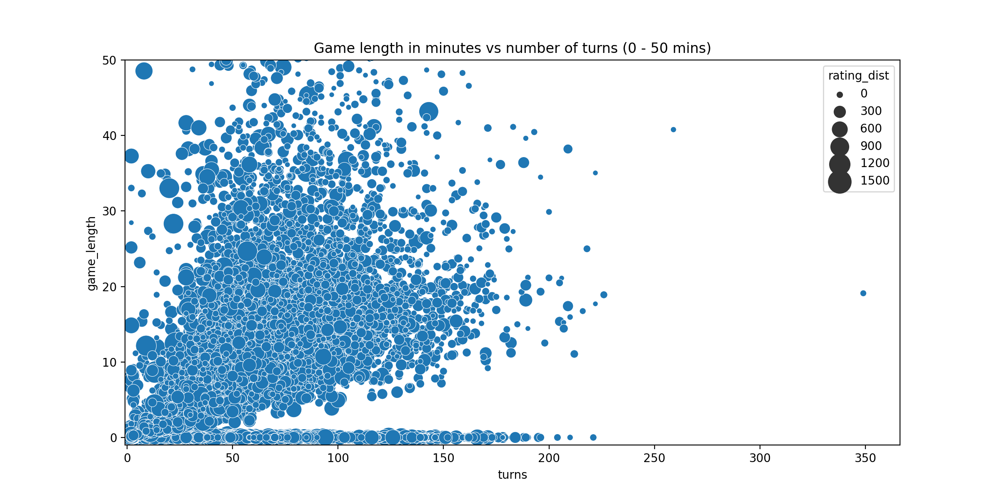

In [27]:
plt.figure(figsize=(12,6))

sns.scatterplot(data=dataset, x='turns', y='game_length', size='rating_dist', sizes=(20, 400))

plt.title('Game length in minutes vs number of turns (0 - 50 mins)')
plt.xlim((-1))
plt.ylim((-1, 50))

plt.show()

<IPython.core.display.Javascript object>


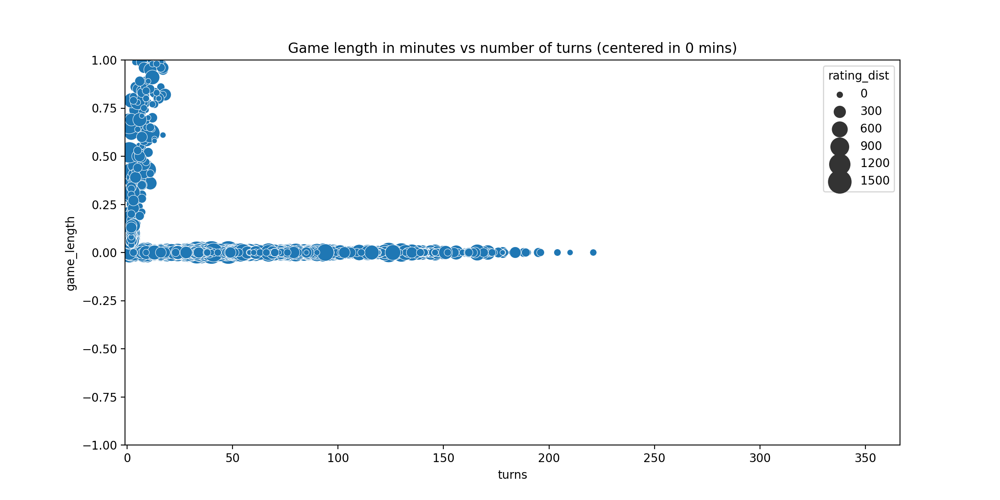

In [28]:
plt.figure(figsize=(12,6))

sns.scatterplot(data=dataset, x='turns', y='game_length', size='rating_dist', sizes=(20, 400))

plt.title('Game length in minutes vs number of turns (centered in 0 mins)')
plt.xlim((-1))
plt.ylim((-1, 1))

plt.show()

In [29]:
# Veient els diferents gràfics identifiquem dos punts on es concentra l'atribut 'game_length', són en el 166.67 i el 0.
# Mirem quantes mostres prensenten aquests síntomes

n1 = len(dataset[dataset["game_length"] == 166.67])
n2 = len(dataset[dataset["game_length"] == 0])

print("Hi ha", n1, "partides amb un temps de joc de 166.7 minuts.")
print("Hi ha", n2, "partides amb un temps de joc de 0 minuts.")

per = (n1 + n2)/llargada * 100

print("El", format(per, '.2f'), "% de les partides del dataset tenen un temps de joc de 0 o 166.7 minuts.")

Hi ha 734 partides amb un temps de joc de 166.7 minuts.
Hi ha 8548 partides amb un temps de joc de 0 minuts.
El 46.28 % de les partides del dataset tenen un temps de joc de 0 o 166.7 minuts.


In [30]:
# Un 46% de les partides amb aquest temps indica que hi ha hagut algun error, així que es desestimarà l'atribut 
# La desestimació d'aquest atribut es pot fer sense problemes ja que en tenim un altre ('turns') que també estima la 
# llargada de la partida

dataset = dataset.drop('game_length', axis=1)
dataset = dataset.drop('created_at', axis=1)
dataset = dataset.drop('last_move_at', axis=1)
dataset.head()

,id,rated,turns,victory_status_outoftime,victory_status_resign,victory_status_mate,victory_status_draw,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply,rated_bi,rating_dist
0,TZJHLljE,False,13,1.000,0.000,0.000,0.000,white,15+2,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5,0,309
1,l1NXvwaE,True,16,0.000,1.000,0.000,0.000,black,5+10,a-00,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4,1,61
2,mIICvQHh,True,61,0.000,0.000,1.000,0.000,white,5+10,ischia,1496,a-00,1500,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3,1,4
3,kWKvrqYL,True,61,0.000,0.000,1.000,0.000,white,20+0,daniamurashov,1439,adivanov2009,1454,d4 d5 Nf3 Bf5 Nc3 Nf6 Bf4 Ng4 e3 Nc6 Be2 Qd7 O...,D02,Queen's Pawn Game: Zukertort Variation,3,1,15
4,9tXo1AUZ,True,95,0.000,0.000,1.000,0.000,white,30+3,nik221107,1523,adivanov2009,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5,1,54


In [31]:
# Ara mirem si hi ha partides duplicades
duplicats = dataset[dataset['id'].duplicated()]

print("En el dataset hi ha", len(duplicats), "duplicats. Que representa un", format(len(duplicats)/llargada*100, '.2f'),"%.")

En el dataset hi ha 945 duplicats. Que representa un 4.71 %.


In [32]:
# Es comprova que tots els atributs de les partides amb el 'id' igual també siguin iguals

def igual(arr):
    np_arr = arr.to_numpy()
    return (np_arr[0] == np_arr).all()

duplicats_id = dataset[dataset['id'].duplicated(keep=False)]['id'].values

def comprovant():
    for ID in duplicats_id:
        dupli = dataset[dataset['id'] == ID]
        for col in dupli:
            if(~igual(dupli[col])):
                return False
    return True

comprovant()

True

In [33]:
# Veiem que tots són iguals, així que eliminem les còpies (només deixant el primer)

dataset_not_duplicated = dataset.drop_duplicates(subset = 'id', keep='first')

In [34]:
len(dataset) - len(dataset_not_duplicated)

945

In [35]:
dataset = dataset_not_duplicated

## FOLLOWING THE PREPROCESSING ##

In [36]:
# dividiré l'atribut de increment code en dues parts: la primera és el temps que té cada jugador i la segona és l'increment

play_time = []
increment = []

increment_code = np.array(dataset['increment_code'])

for code in increment_code:
    play_time.append(code.split('+')[0])
    increment.append(code.split('+')[1])

dataset['play_time'] = play_time
dataset['increment'] = increment

In [37]:
# Transformar l'atribut winner a numèric 
# 1 - guanya blanc
# 0 - guanya negre
# 0.5 - empat

winner_num = []

for el in dataset['winner']:
    if (el == 'white'):
        var = 1
    elif (el == 'black'):
        var = 0
    else:
        var = 0.5
    winner_num.append(var)
    
dataset['winner_num'] = winner_num
dataset

,id,rated,turns,victory_status_outoftime,victory_status_resign,victory_status_mate,victory_status_draw,winner,increment_code,white_id,...,black_rating,moves,opening_eco,opening_name,opening_ply,rated_bi,rating_dist,play_time,increment,winner_num
0,TZJHLljE,False,13,1.000,0.000,0.000,0.000,white,15+2,bourgris,...,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5,0,309,15,2,1.000
1,l1NXvwaE,True,16,0.000,1.000,0.000,0.000,black,5+10,a-00,...,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4,1,61,5,10,0.000
2,mIICvQHh,True,61,0.000,0.000,1.000,0.000,white,5+10,ischia,...,1500,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3,1,4,5,10,1.000
3,kWKvrqYL,True,61,0.000,0.000,1.000,0.000,white,20+0,daniamurashov,...,1454,d4 d5 Nf3 Bf5 Nc3 Nf6 Bf4 Ng4 e3 Nc6 Be2 Qd7 O...,D02,Queen's Pawn Game: Zukertort Variation,3,1,15,20,0,1.000
4,9tXo1AUZ,True,95,0.000,0.000,1.000,0.000,white,30+3,nik221107,...,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5,1,54,30,3,1.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20053,EfqH7VVH,True,24,0.000,1.000,0.000,0.000,white,10+10,belcolt,...,1220,d4 f5 e3 e6 Nf3 Nf6 Nc3 b6 Be2 Bb7 O-O Be7 Ne5...,A80,Dutch Defense,2,1,471,10,10,1.000
20054,WSJDhbPl,True,82,0.000,0.000,1.000,0.000,black,10+0,jamboger,...,1196,d4 d6 Bf4 e5 Bg3 Nf6 e3 exd4 exd4 d5 c3 Bd6 Bd...,A41,Queen's Pawn,2,1,37,10,0,0.000
20055,yrAas0Kj,True,35,0.000,0.000,1.000,0.000,white,10+0,jamboger,...,1286,d4 d5 Bf4 Nc6 e3 Nf6 c3 e6 Nf3 Be7 Bd3 O-O Nbd...,D00,Queen's Pawn Game: Mason Attack,3,1,67,10,0,1.000
20056,b0v4tRyF,True,109,0.000,1.000,0.000,0.000,white,10+0,marcodisogno,...,1227,e4 d6 d4 Nf6 e5 dxe5 dxe5 Qxd1+ Kxd1 Nd5 c4 Nb...,B07,Pirc Defense,4,1,133,10,0,1.000


In [38]:
# Passar l'atribut 'opening_name' i 'opening_eco' a numèric
# Per cada 'opening', crear número sumant:
#     1 per cada partida guanyada pel jugador blanc
#     0 per cada partida guanyada pel jugador negre
#     0.5 per cada partida empatada ??????????????

def nou_atr_num(atr, convert_to):
    atr_unique = set(np.array(dataset[atr]))

    dicc_opn = {}

    for op in atr_unique:
        dicc_opn[op] = dataset[dataset[atr] == op]['winner_num'].mean()

    atr_num = []

    for op in dataset[atr]:
        atr_num.append(dicc_opn[op])

    dataset[convert_to] = atr_num

In [39]:
nou_atr_num('opening_name', 'opening_name_num')
nou_atr_num('opening_eco', 'opening_eco_num')
    
dataset

,id,rated,turns,victory_status_outoftime,victory_status_resign,victory_status_mate,victory_status_draw,winner,increment_code,white_id,...,opening_eco,opening_name,opening_ply,rated_bi,rating_dist,play_time,increment,winner_num,opening_name_num,opening_eco_num
0,TZJHLljE,False,13,1.000,0.000,0.000,0.000,white,15+2,bourgris,...,D10,Slav Defense: Exchange Variation,5,0,309,15,2,1.000,0.368,0.453
1,l1NXvwaE,True,16,0.000,1.000,0.000,0.000,black,5+10,a-00,...,B00,Nimzowitsch Defense: Kennedy Variation,4,1,61,5,10,0.000,0.600,0.620
2,mIICvQHh,True,61,0.000,0.000,1.000,0.000,white,5+10,ischia,...,C20,King's Pawn Game: Leonardis Variation,3,1,4,5,10,1.000,0.465,0.467
3,kWKvrqYL,True,61,0.000,0.000,1.000,0.000,white,20+0,daniamurashov,...,D02,Queen's Pawn Game: Zukertort Variation,3,1,15,20,0,1.000,0.572,0.534
4,9tXo1AUZ,True,95,0.000,0.000,1.000,0.000,white,30+3,nik221107,...,C41,Philidor Defense,5,1,54,30,3,1.000,0.645,0.596
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20053,EfqH7VVH,True,24,0.000,1.000,0.000,0.000,white,10+10,belcolt,...,A80,Dutch Defense,2,1,471,10,10,1.000,0.533,0.565
20054,WSJDhbPl,True,82,0.000,0.000,1.000,0.000,black,10+0,jamboger,...,A41,Queen's Pawn,2,1,37,10,0,0.000,0.678,0.597
20055,yrAas0Kj,True,35,0.000,0.000,1.000,0.000,white,10+0,jamboger,...,D00,Queen's Pawn Game: Mason Attack,3,1,67,10,0,1.000,0.535,0.491
20056,b0v4tRyF,True,109,0.000,1.000,0.000,0.000,white,10+0,marcodisogno,...,B07,Pirc Defense,4,1,133,10,0,1.000,0.316,0.588


In [40]:
dataset

,id,rated,turns,victory_status_outoftime,victory_status_resign,victory_status_mate,victory_status_draw,winner,increment_code,white_id,...,opening_eco,opening_name,opening_ply,rated_bi,rating_dist,play_time,increment,winner_num,opening_name_num,opening_eco_num
0,TZJHLljE,False,13,1.000,0.000,0.000,0.000,white,15+2,bourgris,...,D10,Slav Defense: Exchange Variation,5,0,309,15,2,1.000,0.368,0.453
1,l1NXvwaE,True,16,0.000,1.000,0.000,0.000,black,5+10,a-00,...,B00,Nimzowitsch Defense: Kennedy Variation,4,1,61,5,10,0.000,0.600,0.620
2,mIICvQHh,True,61,0.000,0.000,1.000,0.000,white,5+10,ischia,...,C20,King's Pawn Game: Leonardis Variation,3,1,4,5,10,1.000,0.465,0.467
3,kWKvrqYL,True,61,0.000,0.000,1.000,0.000,white,20+0,daniamurashov,...,D02,Queen's Pawn Game: Zukertort Variation,3,1,15,20,0,1.000,0.572,0.534
4,9tXo1AUZ,True,95,0.000,0.000,1.000,0.000,white,30+3,nik221107,...,C41,Philidor Defense,5,1,54,30,3,1.000,0.645,0.596
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20053,EfqH7VVH,True,24,0.000,1.000,0.000,0.000,white,10+10,belcolt,...,A80,Dutch Defense,2,1,471,10,10,1.000,0.533,0.565
20054,WSJDhbPl,True,82,0.000,0.000,1.000,0.000,black,10+0,jamboger,...,A41,Queen's Pawn,2,1,37,10,0,0.000,0.678,0.597
20055,yrAas0Kj,True,35,0.000,0.000,1.000,0.000,white,10+0,jamboger,...,D00,Queen's Pawn Game: Mason Attack,3,1,67,10,0,1.000,0.535,0.491
20056,b0v4tRyF,True,109,0.000,1.000,0.000,0.000,white,10+0,marcodisogno,...,B07,Pirc Defense,4,1,133,10,0,1.000,0.316,0.588


### BUSCAR RELACIÓ ENTRE ELS OPENINGS I LA VICTÒRIA DE CADA JUGADOR -- FERHO AMB OPENING_NAME ###

In [41]:
dataset.nunique()

id                          19113
rated                           2
turns                         211
victory_status_outoftime        2
victory_status_resign           2
victory_status_mate             2
victory_status_draw             2
winner                          3
increment_code                400
white_id                     9438
white_rating                 1516
black_id                     9331
black_rating                 1521
moves                       18920
opening_eco                   365
opening_name                 1477
opening_ply                    23
rated_bi                        2
rating_dist                   894
play_time                      33
increment                      32
winner_num                      3
opening_name_num              247
opening_eco_num               171
dtype: int64

In [42]:
opening_eco = dataset['opening_eco']
opening_eco_unique = set(opening_eco)

# Creació d'un diccionari amb els diferents openings (unics) distinguits per la lletra (A, B, C, D, E)
# Dins del diccionari hi ha cada opening amb els guanyadors que ha causat

dicc_op = {
    'A': {},
    'B': {},
    'C': {},
    'D': {},
    'E': {},
}

for op_eco in opening_eco_unique:
    dicc_op[op_eco[0]][op_eco] = np.array(dataset[dataset['opening_eco'] == op_eco]['winner'])
    
dicc_op

{'A': {'A20': array(['black', 'white', 'draw', 'black', 'black', 'black', 'black',
         'white', 'white', 'white', 'white', 'white', 'black', 'white',
         'black', 'white', 'black', 'white', 'white', 'black', 'black',
         'black', 'white', 'white', 'white', 'black', 'white', 'black',
         'white', 'black', 'white', 'black', 'white', 'white', 'white',
         'white', 'white', 'white', 'white', 'black', 'white', 'black',
         'black', 'black', 'black', 'black', 'white', 'white', 'black',
         'white', 'black', 'white', 'white', 'white', 'black', 'white',
         'white', 'black', 'black', 'black', 'white', 'white', 'black',
         'black', 'white', 'black', 'white', 'black', 'white', 'white',
         'white', 'white', 'black', 'draw', 'white', 'white', 'black',
         'black', 'white', 'white', 'black', 'white', 'white', 'white',
         'black', 'white', 'white', 'black', 'black', 'draw', 'white',
         'black', 'black', 'white', 'black', 'white'], 

In [43]:
def count(arr, query):
    sum = 0
    for el in arr:
        if (el == query):
            sum += 1
    return sum

<IPython.core.display.Javascript object>


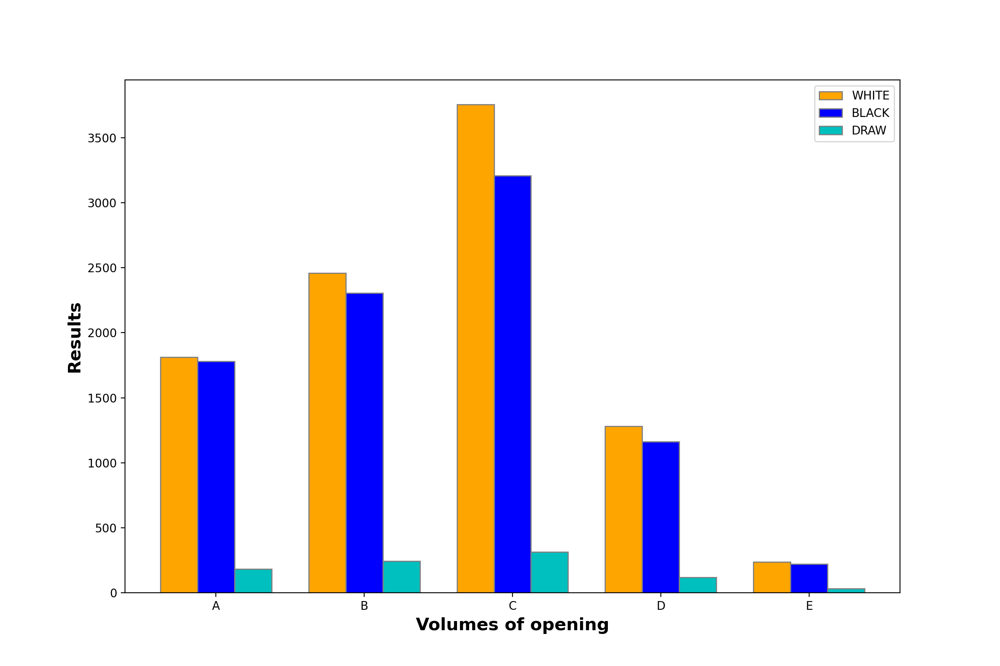

In [44]:
w = []
b = []
d = []
t = []

for op in dicc_op.keys():
    
    white = 0
    black = 0
    draws = 0
    
    for el in dicc_op[op].keys():
        white += count(dicc_op[op][el], 'white')
        black += count(dicc_op[op][el], 'black')
        draws += count(dicc_op[op][el], 'draw')
        
    w.append(white)
    b.append(black)
    d.append(draws)
    t.append(white + black + draws)
        
barWidth = 0.25
fig = plt.subplots(figsize =(12, 8))

br1 = np.arange(len(w))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]

plt.bar(br1, w, color ='orange', width = barWidth,
        edgecolor ='grey', label ='WHITE')
plt.bar(br2, b, color ='b', width = barWidth,
        edgecolor ='grey', label ='BLACK')
plt.bar(br3, d, color ='c', width = barWidth,
        edgecolor ='grey', label ='DRAW')

plt.xlabel('Volumes of opening', fontweight ='bold', fontsize = 15)
plt.ylabel('Results', fontweight ='bold', fontsize = 15)
plt.xticks([r + barWidth for r in range(len(w))],
        ['A', 'B', 'C', 'D', 'E'])
 
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


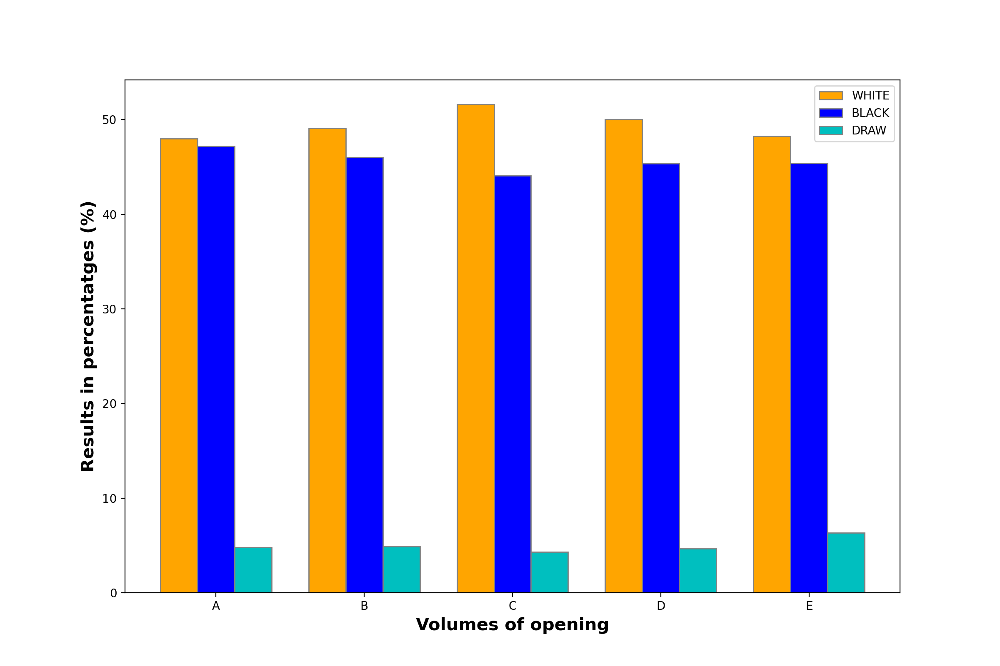

In [45]:
wp = []
bp = []
dp = []
    
for i in range(5):
    wp.append(w[i]/t[i]*100)
    bp.append(b[i]/t[i]*100)
    dp.append(d[i]/t[i]*100)
    

barWidth = 0.25
fig = plt.subplots(figsize =(12, 8))

br1 = np.arange(len(w))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]

plt.bar(br1, wp, color ='orange', width = barWidth,
        edgecolor ='grey', label ='WHITE')
plt.bar(br2, bp, color ='b', width = barWidth,
        edgecolor ='grey', label ='BLACK')
plt.bar(br3, dp, color ='c', width = barWidth,
        edgecolor ='grey', label ='DRAW')

plt.xlabel('Volumes of opening', fontweight ='bold', fontsize = 15)
plt.ylabel('Results in percentatges (%)', fontweight ='bold', fontsize = 15)
plt.xticks([r + barWidth for r in range(len(w))],
        ['A', 'B', 'C', 'D', 'E'])
 
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


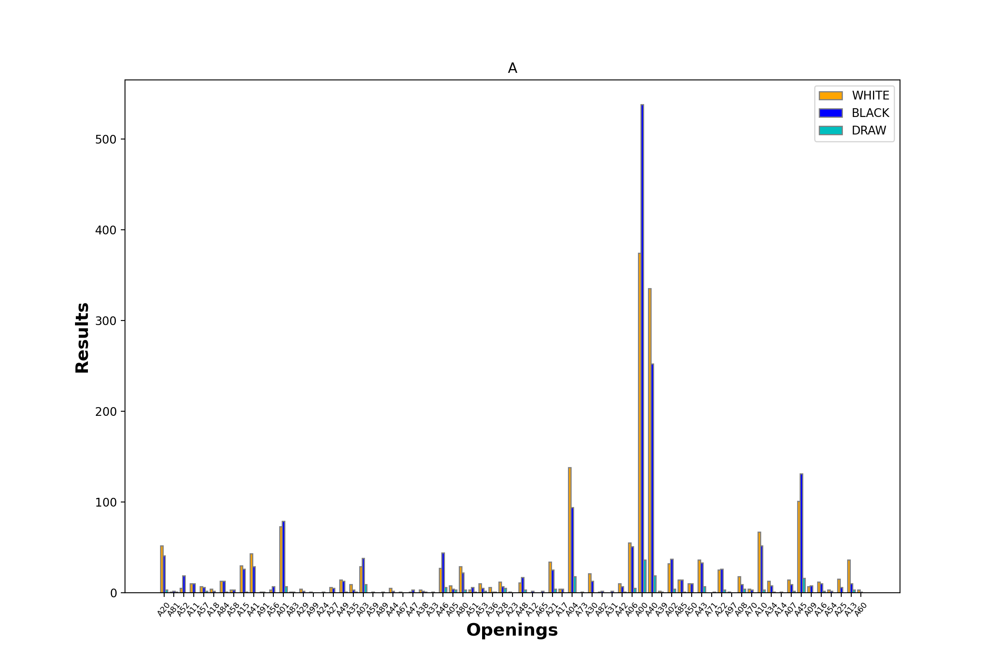

<IPython.core.display.Javascript object>


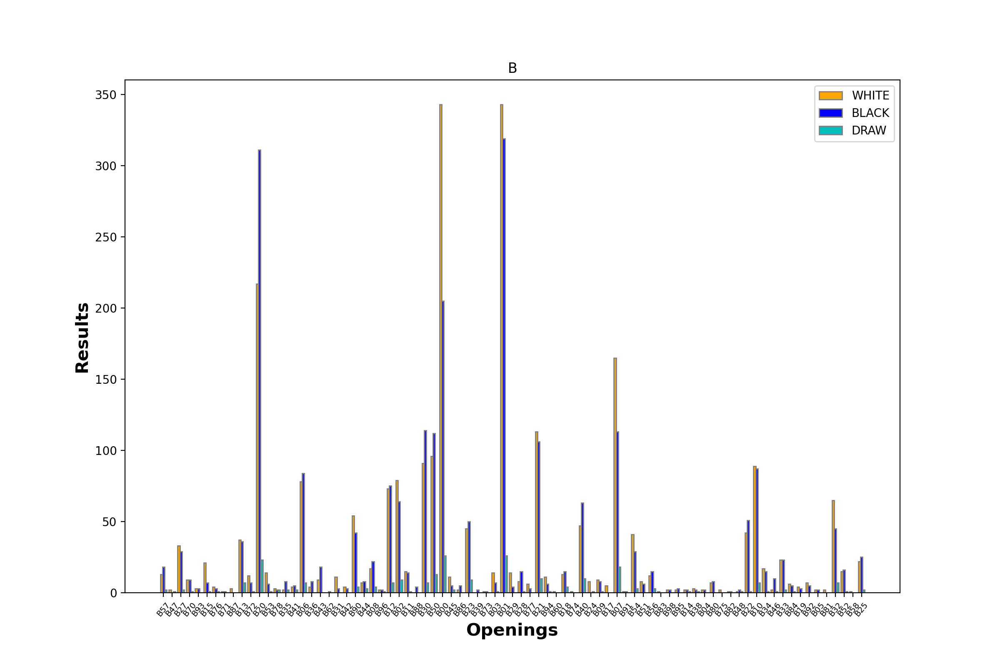

<IPython.core.display.Javascript object>


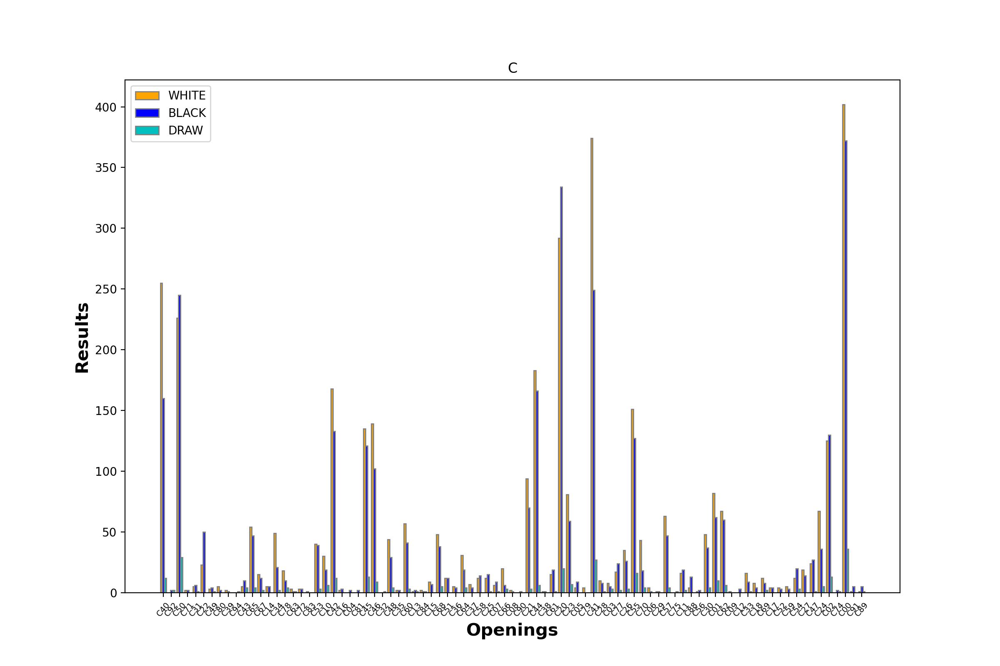

<IPython.core.display.Javascript object>


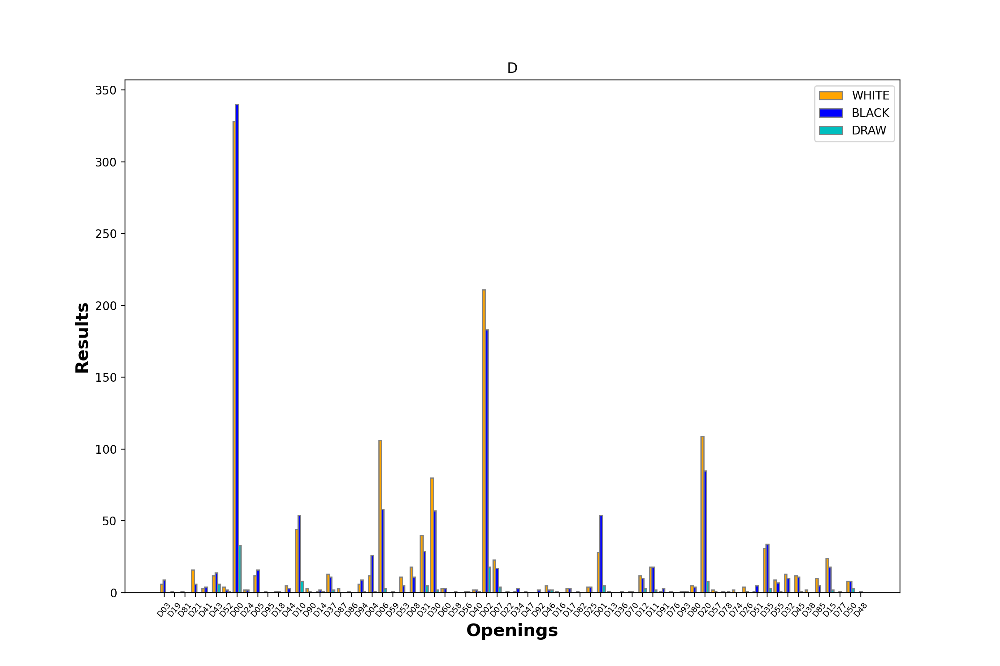

<IPython.core.display.Javascript object>


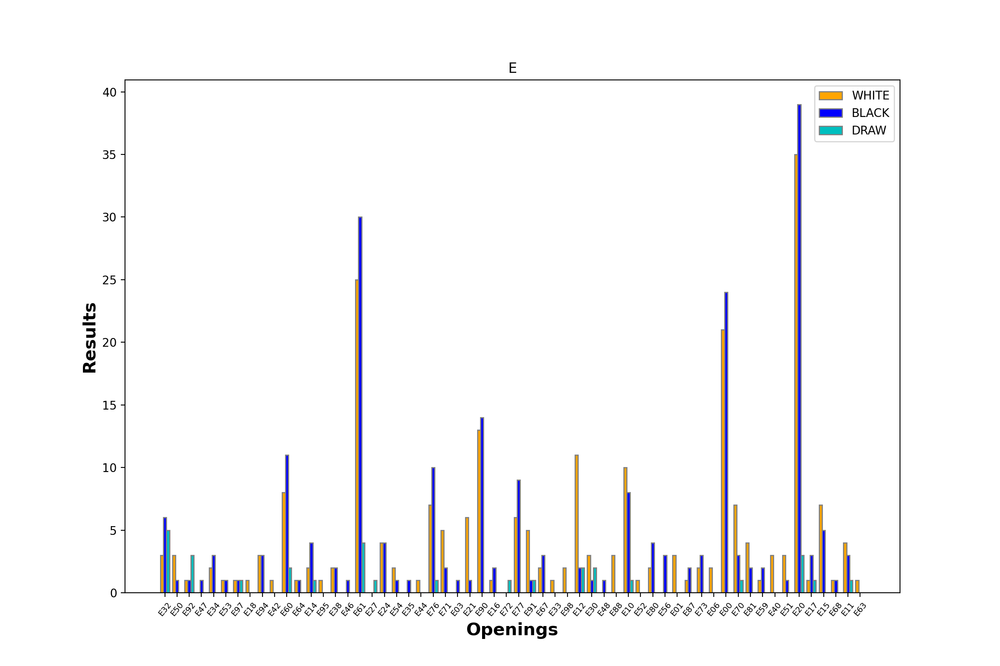

In [46]:
for vol in dicc_op:
    w = []
    b = []
    d = []
    
    fig = plt.subplots(figsize =(12, 8))
    
    barWidth = 0.25
    
    for op in dicc_op[vol]:
        w.append(count(dicc_op[vol][op], 'white'))
        b.append(count(dicc_op[vol][op], 'black'))
        d.append(count(dicc_op[vol][op], 'draw'))
    
    br1 = np.arange(len(w))
    br2 = [x + barWidth for x in br1]
    br3 = [x + barWidth for x in br2]

    plt.bar(br1, w, color ='orange', width = barWidth,
            edgecolor ='grey', label ='WHITE')
    plt.bar(br2, b, color ='b', width = barWidth,
            edgecolor ='grey', label ='BLACK')
    plt.bar(br3, d, color ='c', width = barWidth,
            edgecolor ='grey', label ='DRAW')

    plt.xlabel('Openings', fontweight ='bold', fontsize = 15)
    plt.ylabel('Results', fontweight ='bold', fontsize = 15)
    plt.xticks([r + barWidth for r in range(len(w))],
            dicc_op[vol].keys())
    plt.xticks(rotation=50, fontsize=7)
    
    plt.title(vol)

    plt.legend()
plt.show()
    

<IPython.core.display.Javascript object>


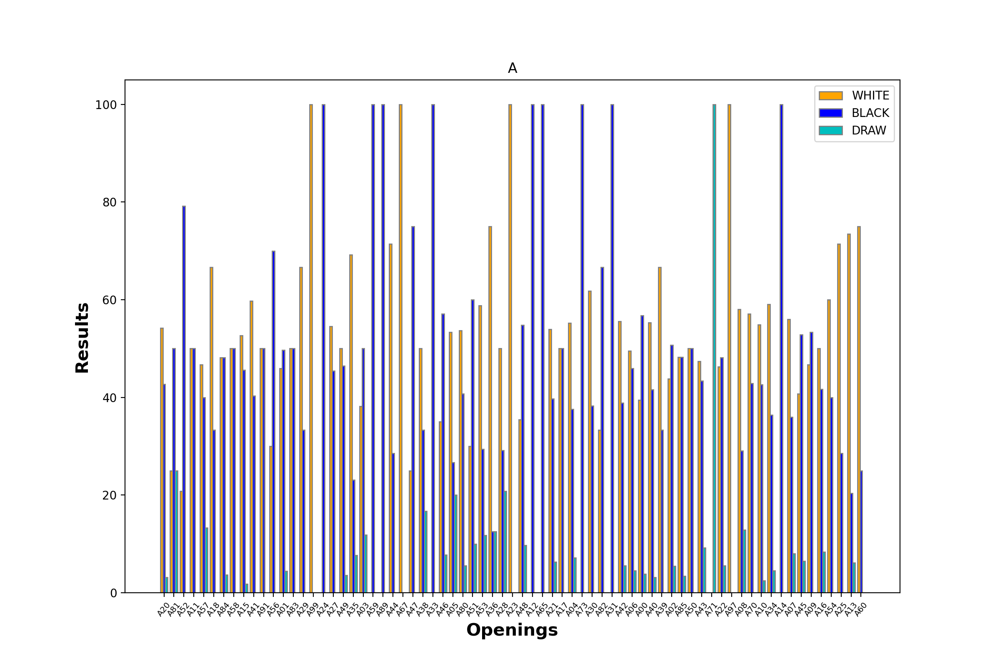

<IPython.core.display.Javascript object>


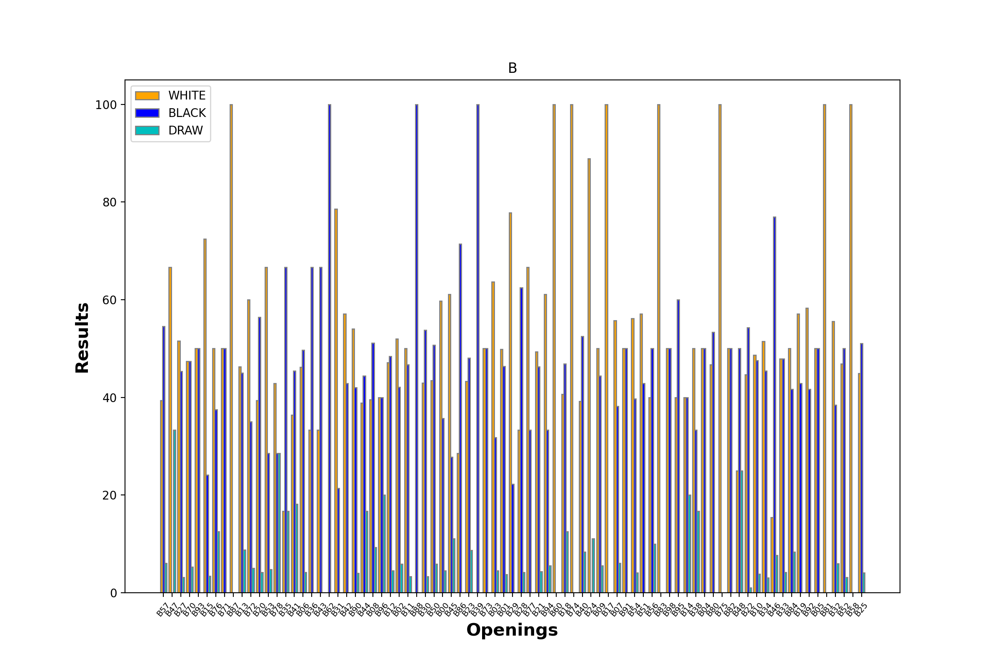

<IPython.core.display.Javascript object>


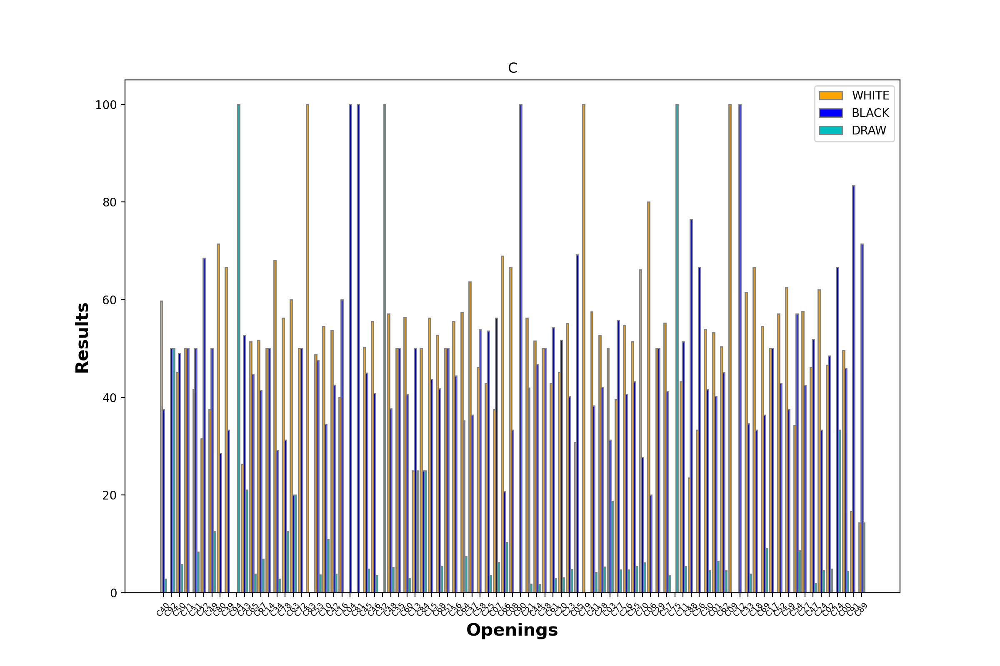

<IPython.core.display.Javascript object>


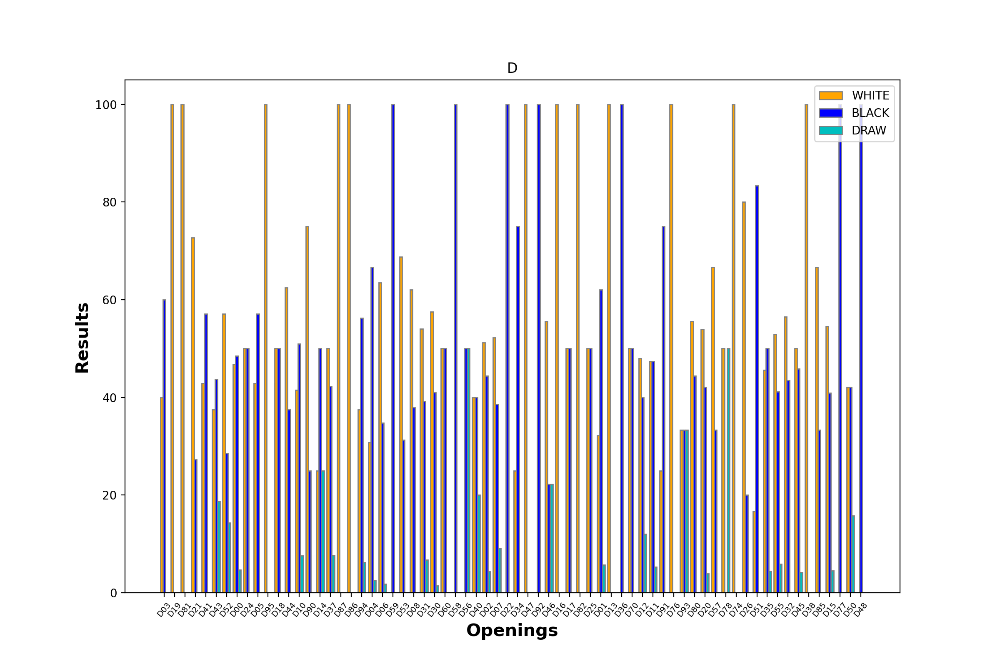

<IPython.core.display.Javascript object>


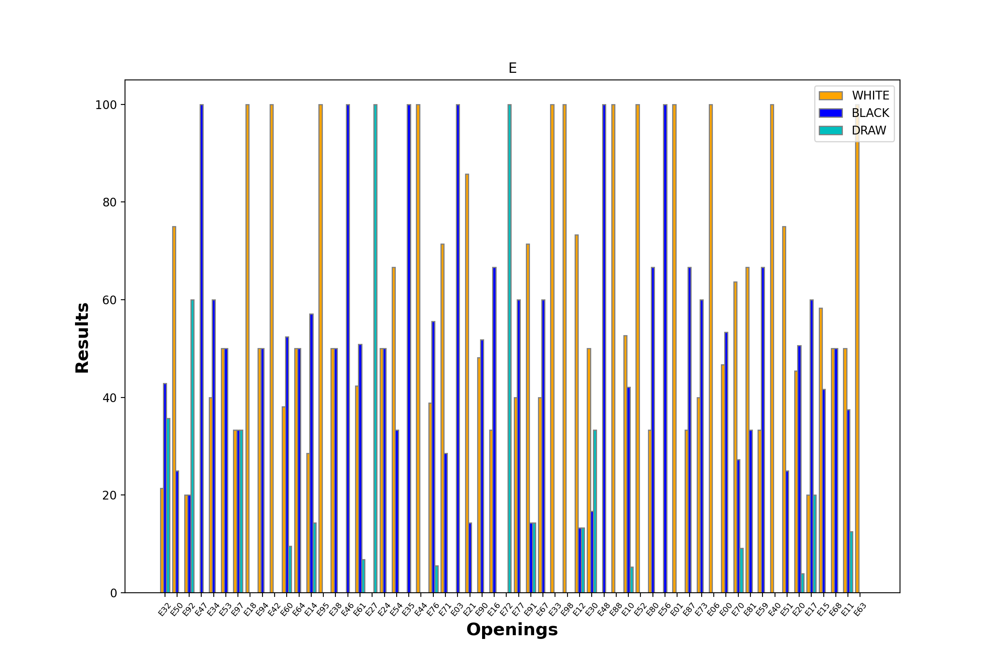

In [47]:
# Ara ho farem amb els percentatges per comprovar els resultats en igualtat de condicions

for vol in dicc_op:
    w = []
    b = []
    d = []
    
    fig = plt.subplots(figsize =(12, 8))
    
    barWidth = 0.25
    
    for op in dicc_op[vol]:
        l = len(dicc_op[vol][op])
        w.append(count(dicc_op[vol][op], 'white')/l*100)
        b.append(count(dicc_op[vol][op], 'black')/l*100)
        d.append(count(dicc_op[vol][op], 'draw')/l*100)
    
    br1 = np.arange(len(w))
    br2 = [x + barWidth for x in br1]
    br3 = [x + barWidth for x in br2]

    plt.bar(br1, w, color ='orange', width = barWidth,
            edgecolor ='grey', label ='WHITE')
    plt.bar(br2, b, color ='b', width = barWidth,
            edgecolor ='grey', label ='BLACK')
    plt.bar(br3, d, color ='c', width = barWidth,
            edgecolor ='grey', label ='DRAW')

    plt.xlabel('Openings', fontweight ='bold', fontsize = 15)
    plt.ylabel('Results', fontweight ='bold', fontsize = 15)
    plt.xticks([r + barWidth for r in range(len(w))],
            dicc_op[vol].keys())
    plt.xticks(rotation=50, fontsize=7)
    
    plt.title(vol)

    plt.legend()
plt.show()
    

* A00 + BLACK
* A40 + WHITE
* B01 =
* B20 + BLACK
* B00 + WHITE +
* C00 = 
* C41 + WHITE
* D00 =

Openings are divided in five volumes labeled from "A" to "E"

In [48]:
dataset['winner_n'] = dataset['winner'].apply(lambda x: 1 if x=='white' else (0 if x=='black' else 2))

In [49]:
dataset.head()

,id,rated,turns,victory_status_outoftime,victory_status_resign,victory_status_mate,victory_status_draw,winner,increment_code,white_id,...,opening_name,opening_ply,rated_bi,rating_dist,play_time,increment,winner_num,opening_name_num,opening_eco_num,winner_n
0,TZJHLljE,False,13,1.000,0.000,0.000,0.000,white,15+2,bourgris,...,Slav Defense: Exchange Variation,5,0,309,15,2,1.000,0.368,0.453,1
1,l1NXvwaE,True,16,0.000,1.000,0.000,0.000,black,5+10,a-00,...,Nimzowitsch Defense: Kennedy Variation,4,1,61,5,10,0.000,0.600,0.620,0
2,mIICvQHh,True,61,0.000,0.000,1.000,0.000,white,5+10,ischia,...,King's Pawn Game: Leonardis Variation,3,1,4,5,10,1.000,0.465,0.467,1
3,kWKvrqYL,True,61,0.000,0.000,1.000,0.000,white,20+0,daniamurashov,...,Queen's Pawn Game: Zukertort Variation,3,1,15,20,0,1.000,0.572,0.534,1
4,9tXo1AUZ,True,95,0.000,0.000,1.000,0.000,white,30+3,nik221107,...,Philidor Defense,5,1,54,30,3,1.000,0.645,0.596,1


In [50]:
# Treure els següents atributs ja que no tenen impacte en el joc o perquè ja s'ha convertit en un altre atribut (conversió
# a numèric)

dataset = dataset.drop('id', axis=1)
dataset = dataset.drop('rated', axis=1)
dataset = dataset.drop('increment_code', axis=1)
dataset = dataset.drop('white_id', axis=1)
dataset = dataset.drop('white_rating', axis=1) 
dataset = dataset.drop('black_id', axis=1)
dataset = dataset.drop('black_rating', axis=1) 
dataset = dataset.drop('moves', axis=1)
dataset = dataset.drop('opening_eco', axis=1)
dataset = dataset.drop('opening_name', axis=1)
dataset = dataset.drop('winner', axis=1)
dataset = dataset.drop('winner_num', axis=1)

dataset.head()

,turns,victory_status_outoftime,victory_status_resign,victory_status_mate,victory_status_draw,opening_ply,rated_bi,rating_dist,play_time,increment,opening_name_num,opening_eco_num,winner_n
0,13,1.000,0.000,0.000,0.000,5,0,309,15,2,0.368,0.453,1
1,16,0.000,1.000,0.000,0.000,4,1,61,5,10,0.600,0.620,0
2,61,0.000,0.000,1.000,0.000,3,1,4,5,10,0.465,0.467,1
3,61,0.000,0.000,1.000,0.000,3,1,15,20,0,0.572,0.534,1
4,95,0.000,0.000,1.000,0.000,5,1,54,30,3,0.645,0.596,1


In [51]:
# Let's scale the data (only those attributes which aren't categorical)

atr_to_scale = ['turns', 'opening_ply', 'rating_dist', 'play_time', 'increment']

scaler = StandardScaler()

dataset[atr_to_scale] = scaler.fit_transform(dataset[atr_to_scale])

dataset.head()

,turns,victory_status_outoftime,victory_status_resign,victory_status_mate,victory_status_draw,opening_ply,rated_bi,rating_dist,play_time,increment,opening_name_num,opening_eco_num,winner_n
0,-1.419,1.000,0.000,0.000,0.000,0.066,0,0.769,0.071,-0.228,0.368,0.453,1
1,-1.329,0.000,1.000,0.000,0.000,-0.292,1,-0.627,-0.515,0.351,0.600,0.620,0
2,0.015,0.000,0.000,1.000,0.000,-0.649,1,-0.947,-0.515,0.351,0.465,0.467,1
3,0.015,0.000,0.000,1.000,0.000,-0.649,1,-0.885,0.364,-0.373,0.572,0.534,1
4,1.030,0.000,0.000,1.000,0.000,0.066,1,-0.666,0.950,-0.155,0.645,0.596,1


Preprocessing acabat. Ha quedat un dataset de 13 atributs numèrics.

L'atribut objectiu és 'winner num', que diu si el resultat de la partida ha sigut un empat (0.5), vicòria del jugador blanc (1) o victòria del jugador negre (0)

In [52]:
# Correlations

<IPython.core.display.Javascript object>


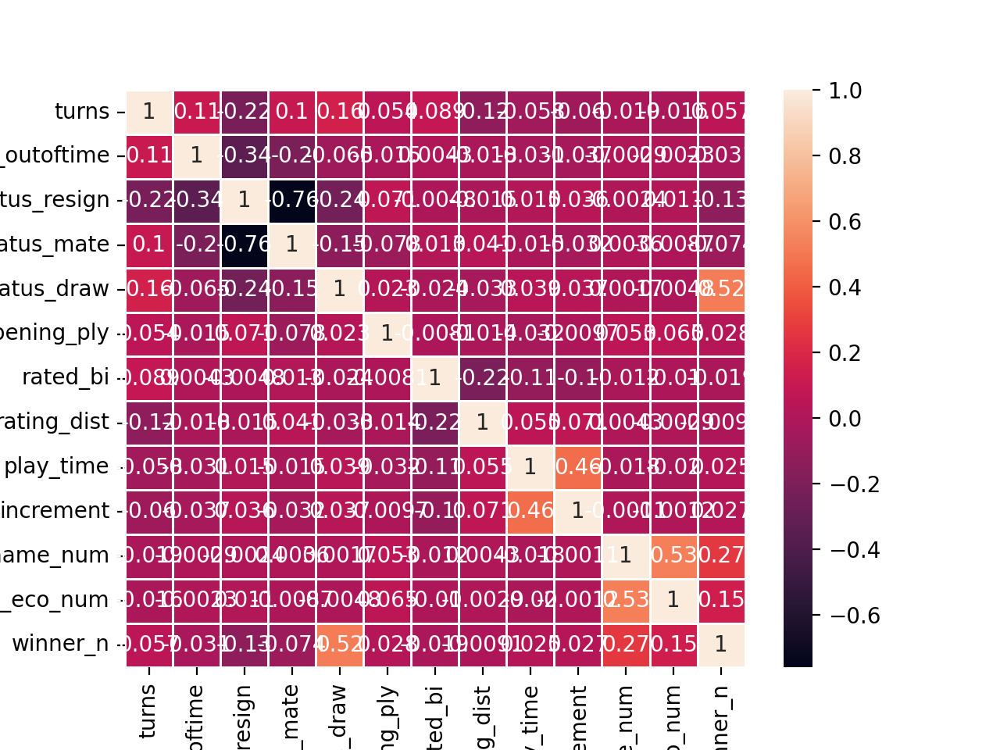

In [53]:
import seaborn as sns

# Mirem la correlació entre els atributs d'entrada per entendre millor les dades
correlacio = dataset.corr()

plt.figure()

ax = sns.heatmap(correlacio, annot=True, linewidths=.5)

<IPython.core.display.Javascript object>


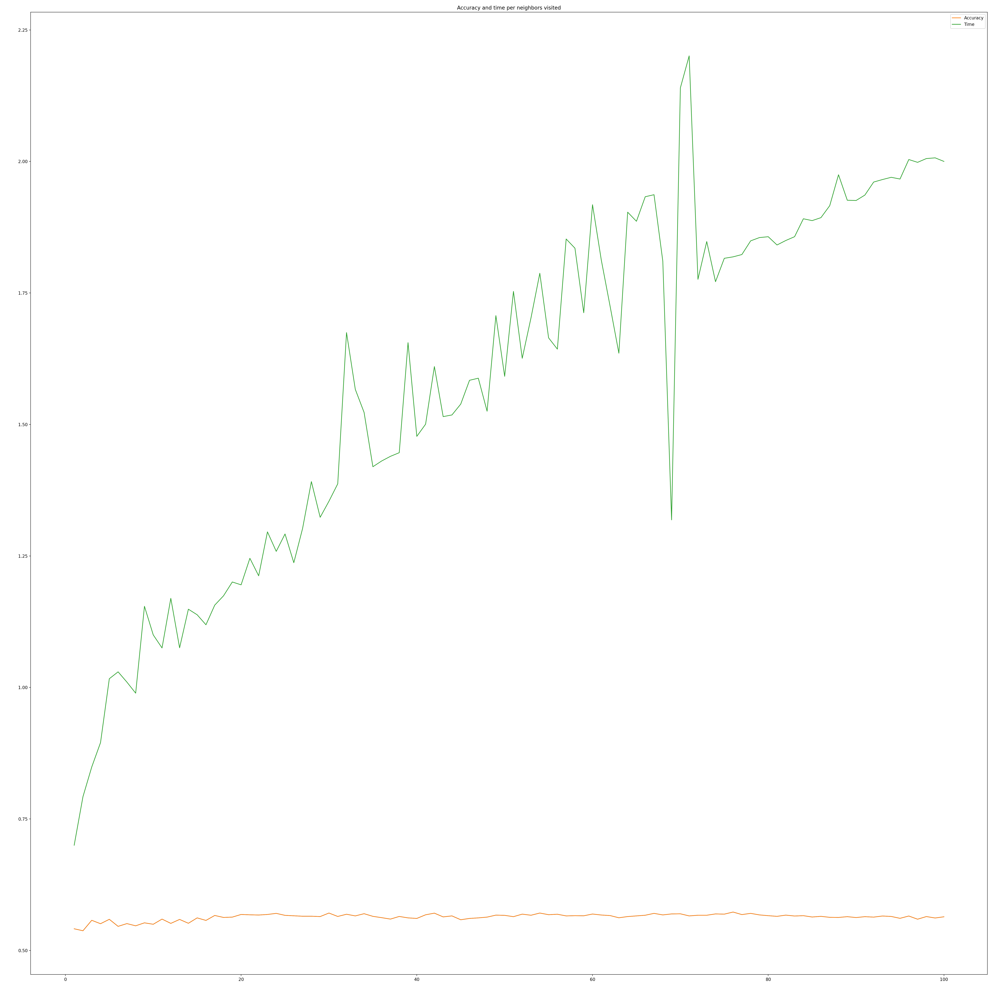

In [55]:
# Mirem la relació entre atributs utilitzant la funció pairplot
relacio = sns.pairplot(dataset)

### MODEL ###

In [141]:
# Tremendisima funció per evaluar models

# https://medium.com/analytics-vidhya/building-classification-model-with-python-9bdfc13faa4b

def evaluate_model(model, x_test, y_test):
    from sklearn import metrics

    # Predict Test Data 
    y_pred = model.predict(x_test)

    # Calculate accuracy, precision, recall, f1-score, and kappa score
    acc = metrics.accuracy_score(y_test, y_pred) 
    prec = metrics.precision_score(y_test, y_pred, average='micro')
    rec = metrics.recall_score(y_test, y_pred, average='micro')
    f1 = metrics.f1_score(y_test, y_pred, average='micro')
    kappa = metrics.cohen_kappa_score(y_test, y_pred)

    # Calculate area under curve (AUC)
    fpr = [None]*3
    tpr = [None]*3
    auc = [None]*3
    for i in range(3):
        y_pred_proba = model.predict_proba(x_test)[::,i]
        fpr[i], tpr[i], _ = metrics.roc_curve(y_test == i, y_pred_proba)
        auc[i] = metrics.roc_auc_score(y_test == i, y_pred_proba)

    # Display confussion matrix
    cm = metrics.confusion_matrix(y_test, y_pred)

    return {'acc': acc, 'prec': prec, 'rec': rec, 'f1': f1, 'kappa': kappa, 
            'fpr': fpr, 'tpr': tpr, 'auc': auc, 'cm': cm}

In [113]:
# Divide the data. First by setting X, y and then split in train and test

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

y = dataset["winner_n"].values
X = dataset.drop(["winner_n"],axis=1) 

x_train, x_test, y_train, y_test = train_test_split(X,y,test_size = 0.25,random_state=1)

Per avaluar els models, primer aplicaré crossvalidation per evitar l'overfitting, i si no hi ha cap resultat extrany avaluaré cada model amb la funció anterior.

#### KNN MODEL ####

In [78]:
# KNN model

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
import time

import warnings
warnings.filterwarnings('ignore')

# Busqueda de la millor k

accuracy = []
t = []
kl = []

for k in range(1,101):
    
    i = time.time()

    KNN = KNeighborsClassifier(n_neighbors = k)
    KNN.fit(x_train, y_train)
    pred = KNN.predict(x_test)
    acc = accuracy_score(y_test, pred)
    
    f = time.time()
    accuracy.append(acc)
    kl.append(k)
    t.append(f-i)
    
print("Max accuracy: ", max(accuracy), " with k = ", accuracy.index(max(accuracy)), " and time = ", t[accuracy.index(max(accuracy))])

Max accuracy:  0.5729232056915673  with k =  75  and time =  1.8186142444610596


<IPython.core.display.Javascript object>


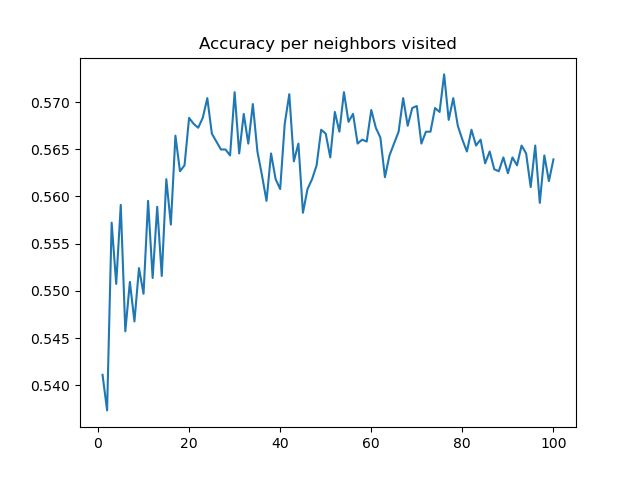

<IPython.core.display.Javascript object>


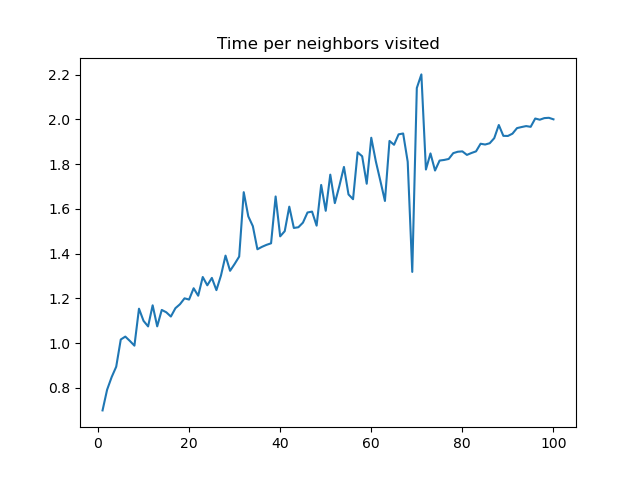

In [86]:
plt.figure()
plt.plot(kl, accuracy)
plt.title("Accuracy per neighbors visited")

plt.figure()
plt.plot(kl, t)
plt.title("Time per neighbors visited")

plt.show()

In [118]:
# best a priori -> k = 75

# crossvalidation - 5 kfolds

KNN = KNeighborsClassifier(n_neighbors = 75)
#KNN.fit(x_train, y_train)
scores = cross_val_score(KNN, X, y, cv=5, error_score = 'raise')

print(scores)
print("KNN mean accuracy:", scores.mean())

[0.57467957 0.56133926 0.56630918 0.5685505  0.55913134]
KNN mean accuracy: 0.5660019713231477


#### RANDOM FOREST CLASSIFIER MODEL ####

In [119]:
from sklearn.ensemble import RandomForestClassifier

RF = RandomForestClassifier()
#RF.fit(x_train, y_train)
scores = cross_val_score(RF, X, y, cv=5, error_score = 'raise')

print(scores)
print("Random forest mean accuracy:", scores.mean())

[0.62804081 0.63405702 0.63850379 0.62663527 0.63997907]
Random forest mean accuracy: 0.6334431919611845


#### NAIVE BAYES MODEL ####

In [120]:
# Fitting Naive Bayes to the Training set  
from sklearn.naive_bayes import GaussianNB

NB = GaussianNB()  
#NB.fit(x_train, y_train)  
scores = cross_val_score(NB, X, y, cv=5, error_score = 'raise')

print(scores)
print("Naive Bayes accuracy:", scores.mean())

[0.62333246 0.61783939 0.63928852 0.61721612 0.6177394 ]
Naive Bayes accuracy: 0.6230831784211703


#### DECISION TREE MODEL ####

In [89]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

In [121]:
DT = DecisionTreeClassifier()
#DT_gini.fit(x_train, y_train)
scores = cross_val_score(DT, X, y, cv=5, error_score = 'raise')

print(scores)
print("Decision Tree Classifier accuracy:", scores.mean())

[0.66832331 0.72430029 0.72979336 0.71323914 0.73024594]
Decision Tree Classifier accuracy: 0.713180407276293


#### SUPPORT VECTOR MACHINE ####

In [97]:
from sklearn import svm
from sklearn.svm import SVC

In [147]:
# Linear Kernel

svm_linear = SVC(kernel= "linear")
scores = cross_val_score(svm_linear, X, y, cv=5, error_score = 'raise')

print(scores)
print("SVM with linear kernel test accuracy:",scores.mean())

[0.63144128 0.6301334  0.64765891 0.6274202  0.62872841]
SVM with linear kernel test accuracy: 0.6330764398960655


#### LOGISTIC REGRESSION  ####

In [124]:
from sklearn.linear_model import LogisticRegression

logmodel = LogisticRegression()
#logmodel.fit(x_train,y_train)
scores = cross_val_score(logmodel, X, y, cv=5, error_score = 'raise')

print(scores)
print("Logistic Regression mean accuracy:", scores.mean())

[0.63248758 0.62882553 0.64164269 0.6329147  0.63134485]
Logistic Regression mean accuracy: 0.6334430687705976


### MODEL COMPARISION ###

In [ ]:
# Després de veure que no hi ha overfitting, compararé el rendiment dels diferents models utilitzant la funció anterior.

In [143]:
# KNN

KNN = KNeighborsClassifier(n_neighbors = 75)
KNN.fit(x_train, y_train)
KNN_eval = evaluate_model(KNN, x_test, y_test)

# Print result
print('Accuracy:', KNN_eval['acc'])
print('Precision:', KNN_eval['prec'])
print('Recall:', KNN_eval['rec'])
print('F1 Score:', KNN_eval['f1'])
print('Cohens Kappa Score:', KNN_eval['kappa'])
print('Area Under Curve:', KNN_eval['auc'])
print('Confusion Matrix:\n', KNN_eval['cm'])

Accuracy: 0.5689474785519983
Precision: 0.5689474785519983
Recall: 0.5689474785519983
F1 Score: 0.5689474785519983
Cohens Kappa Score: 0.19808375647852616
Area Under Curve: [0.6097652987507268, 0.6134969980856292, 0.9975722358560642]
Confusion Matrix:
 [[ 923 1281    0]
 [ 733 1608    0]
 [  17   29  188]]


In [144]:
# Random Forest

RF = RandomForestClassifier()
RF.fit(x_train, y_train)
RF_eval = evaluate_model(RF, x_test, y_test)

# Print result
print('Accuracy:', RF_eval['acc'])
print('Precision:', RF_eval['prec'])
print('Recall:', RF_eval['rec'])
print('F1 Score:', RF_eval['f1'])
print('Cohens Kappa Score:', RF_eval['kappa'])
print('Area Under Curve:', RF_eval['auc'])
print('Confusion Matrix:\n', RF_eval['cm'])

Accuracy: 0.6294203808328103
Precision: 0.6294203808328103
Recall: 0.6294203808328103
F1 Score: 0.6294203808328103
Cohens Kappa Score: 0.31715715453728244
Area Under Curve: [0.7002989269289729, 0.7026351772571476, 0.993986065273194]
Confusion Matrix:
 [[1258  946    0]
 [ 807 1533    1]
 [   9    8  217]]


In [145]:
# Naive Bayes

NB = GaussianNB()  
NB.fit(x_train, y_train) 
NB_eval = evaluate_model(NB, x_test, y_test)

# Print result
print('Accuracy:', NB_eval['acc'])
print('Precision:', NB_eval['prec'])
print('Recall:', NB_eval['rec'])
print('F1 Score:', NB_eval['f1'])
print('Cohens Kappa Score:', NB_eval['kappa'])
print('Area Under Curve:', NB_eval['auc'])
print('Confusion Matrix:\n', NB_eval['cm'])

Accuracy: 0.6229336681314083
Precision: 0.6229336681314083
Recall: 0.6229336681314083
F1 Score: 0.6229336681314083
Cohens Kappa Score: 0.3064904636940534
Area Under Curve: [0.6882605324828643, 0.6944607294653673, 0.9991730369618158]
Confusion Matrix:
 [[1307  895    2]
 [ 887 1453    1]
 [  17    0  217]]


In [146]:
# Decision Tree

DT = DecisionTreeClassifier()
DT.fit(x_train, y_train)
DT_eval = evaluate_model(DT, x_test, y_test)

# Print result
print('Accuracy:', DT_eval['acc'])
print('Precision:', DT_eval['prec'])
print('Recall:', DT_eval['rec'])
print('F1 Score:', DT_eval['f1'])
print('Cohens Kappa Score:', DT_eval['kappa'])
print('Area Under Curve:', DT_eval['auc'])
print('Confusion Matrix:\n', DT_eval['cm'])

Accuracy: 0.7057961916718979
Precision: 0.7057961916718979
Recall: 0.7057961916718979
F1 Score: 0.7057961916718979
Cohens Kappa Score: 0.45913809656088156
Area Under Curve: [0.7046813384314485, 0.709996464213389, 0.9624650926631124]
Confusion Matrix:
 [[1468  726   10]
 [ 652 1688    1]
 [   9    8  217]]


In [149]:
# SVM linear kernel

SVM = SVC(kernel= "linear", random_state=1, probability=True)
SVM.fit(x_train,y_train)
SVM_eval = evaluate_model(SVM, x_test, y_test)

# Print result
print('Accuracy:', SVM_eval['acc'])
print('Precision:', SVM_eval['prec'])
print('Recall:', SVM_eval['rec'])
print('F1 Score:', SVM_eval['f1'])
print('Cohens Kappa Score:', SVM_eval['kappa'])
print('Area Under Curve:', SVM_eval['auc'])
print('Confusion Matrix:\n', SVM_eval['cm'])

Accuracy: 0.6415568110483365
Precision: 0.6415568110483365
Recall: 0.6415568110483365
F1 Score: 0.6415568110483365
Cohens Kappa Score: 0.33892552495385597
Area Under Curve: [0.7045116557715011, 0.7075606611675666, 0.973021917576373]
Confusion Matrix:
 [[1253  951    0]
 [ 745 1596    0]
 [  10    7  217]]


In [150]:
# Logistic Regression

LR = LogisticRegression()
LR.fit(x_train,y_train)
LR_eval = evaluate_model(LR, x_test, y_test)

# Print result
print('Accuracy:', LR_eval['acc'])
print('Precision:', LR_eval['prec'])
print('Recall:', LR_eval['rec'])
print('F1 Score:', LR_eval['f1'])
print('Cohens Kappa Score:', LR_eval['kappa'])
print('Area Under Curve:', LR_eval['auc'])
print('Confusion Matrix:\n', LR_eval['cm'])

Accuracy: 0.6398828206737811
Precision: 0.6398828206737811
Recall: 0.6398828206737811
F1 Score: 0.6398828206737811
Cohens Kappa Score: 0.33595573737442086
Area Under Curve: [0.7045666308388984, 0.7073279790754321, 0.9993277105488327]
Confusion Matrix:
 [[1258  946    0]
 [ 758 1583    0]
 [   8    9  217]]


Per comparar els models crearé 2 plots; un que mostrarà el 'accuracy', 'precision', 'recall', 'f1', 'kappa score' de tots els models, i l'altre que mostrarà el 'AUC' dels models.

In [153]:
LR_eval['fpr']

[array([0.        , 0.        , 0.        , ..., 0.86679612, 0.86679612,
        1.        ]),
 array([0.        , 0.        , 0.        , ..., 0.86423298, 0.86423298,
        1.        ]),
 array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 4.40044004e-04,
        4.40044004e-04, 1.98019802e-03, 1.98019802e-03, 2.64026403e-03,
        2.64026403e-03, 3.08030803e-03, 3.08030803e-03, 4.18041804e-03,
        4.18041804e-03, 4.62046205e-03, 4.62046205e-03, 6.82068207e-03,
        6.82068207e-03, 1.12211221e-02, 1.12211221e-02, 1.16611661e-02,
        1.16611661e-02, 1.21012101e-02, 1.21012101e-02, 1.51815182e-02,
        1.51815182e-02, 1.56215622e-02, 1.56215622e-02, 1.62816282e-02,
        1.62816282e-02, 3.30033003e-02, 3.30033003e-02, 1.00000000e+00])]

<IPython.core.display.Javascript object>


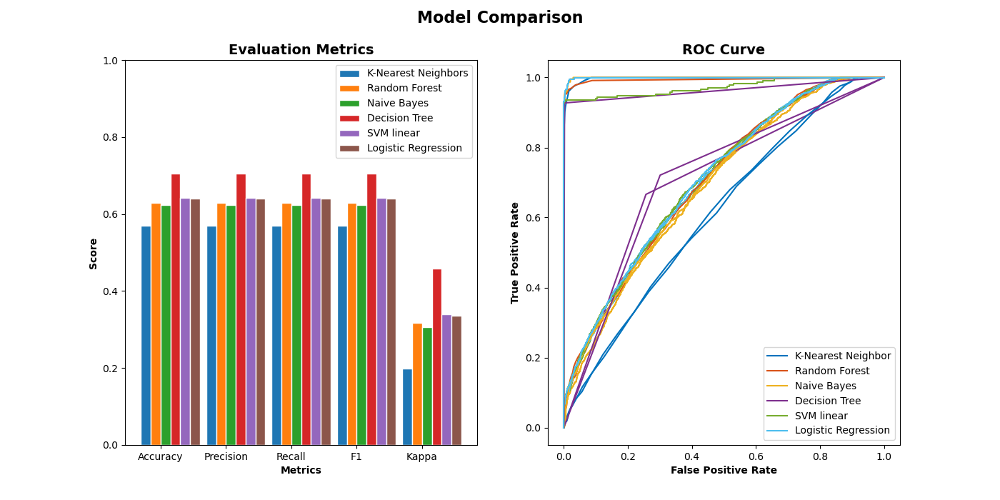

In [163]:
# Intitialize figure with two plots
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.suptitle('Model Comparison', fontsize=16, fontweight='bold')
fig.set_figheight(7)
fig.set_figwidth(14)
fig.set_facecolor('white')

# First plot
## set bar size
barWidth = 0.15
KNN_score = [KNN_eval['acc'], KNN_eval['prec'], KNN_eval['rec'], KNN_eval['f1'], KNN_eval['kappa']]
RF_score = [RF_eval['acc'], RF_eval['prec'], RF_eval['rec'], RF_eval['f1'], RF_eval['kappa']]
NB_score = [NB_eval['acc'], NB_eval['prec'], NB_eval['rec'], NB_eval['f1'], NB_eval['kappa']]
DT_score = [DT_eval['acc'], DT_eval['prec'], DT_eval['rec'], DT_eval['f1'], DT_eval['kappa']]
SVM_score = [SVM_eval['acc'], SVM_eval['prec'], SVM_eval['rec'], SVM_eval['f1'], SVM_eval['kappa']]
LR_score = [LR_eval['acc'], LR_eval['prec'], LR_eval['rec'], LR_eval['f1'], LR_eval['kappa']]

## Set position of bar on X axis
r1 = np.arange(len(KNN_score))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r4]
r6 = [x + barWidth for x in r5]

## Make the plot
ax1.bar(r1, KNN_score, width=barWidth, edgecolor='white', label='K-Nearest Neighbors')
ax1.bar(r2, RF_score, width=barWidth, edgecolor='white', label='Random Forest')
ax1.bar(r3, NB_score, width=barWidth, edgecolor='white', label='Naive Bayes')
ax1.bar(r4, DT_score, width=barWidth, edgecolor='white', label='Decision Tree')
ax1.bar(r5, SVM_score, width=barWidth, edgecolor='white', label='SVM linear')
ax1.bar(r6, LR_score, width=barWidth, edgecolor='white', label='Logistic Regression')

## Configure x and y axis
ax1.set_xlabel('Metrics', fontweight='bold')
labels = ['Accuracy', 'Precision', 'Recall', 'F1', 'Kappa']
ax1.set_xticks([r + (barWidth * 1.5) for r in range(len(LR_score))], )
ax1.set_xticklabels(labels)
ax1.set_ylabel('Score', fontweight='bold')
ax1.set_ylim(0, 1)

## Create legend & title
ax1.set_title('Evaluation Metrics', fontsize=14, fontweight='bold')
ax1.legend()

# Second plot
## Comparing ROC Curve

for i in range(3):
    ax2.plot(KNN_eval['fpr'][i], KNN_eval['tpr'][i], '#0072BD')
    ax2.plot(RF_eval['fpr'][i], RF_eval['tpr'][i], '#D95319')
    ax2.plot(NB_eval['fpr'][i], NB_eval['tpr'][i], '#EDB120')
    ax2.plot(DT_eval['fpr'][i], DT_eval['tpr'][i], '#7E2F8E')
    ax2.plot(SVM_eval['fpr'][i], SVM_eval['tpr'][i], '#77AC30')
    ax2.plot(LR_eval['fpr'][i], LR_eval['tpr'][i], '#4DBEEE')

## Configure x and y axis
ax2.set_xlabel('False Positive Rate', fontweight='bold')
ax2.set_ylabel('True Positive Rate', fontweight='bold')

## Create legend & title
ax2.set_title('ROC Curve', fontsize=14, fontweight='bold')
ax2.legend(['K-Nearest Neighbor', 'Random Forest', 'Naive Bayes', 'Decision Tree', 'SVM linear', 'Logistic Regression'], loc=4)

plt.show()

En la ROC curve hi ha una línia per cada possible resultat (guanya blanc/negre o empat) per cada model, per això hi ha tantes.

Podemm veure que el millor model és el Decision Tree, sent el que té el millor rendiment en totes les mètriques, així que escullo el Decision Tree per resoldre el problema.